# HyperspectralTrios package

This notebook aims to present the HyperspectralTrios package and its many functionalities. <br>
The HyperspectralTrios package was born from the necessity to manipulate hyperspectral field measurements obtained from TRIOS equipment. <br>
This notebook will be divided in 3 sections:
* TriosMDB class: Provides the base functions used to access and extract radiometry measurements from .MDB files in Trios/MSDA format
* Radiometry class: responsible for maintaining a radiometry measurement
* RadiometryDB class: responsible for maintaining a hyperspectral database

## Installation

The `HyperspectralTrios` package is currently part of the WaterClassification project and it is not availble to be installed through PyPI. It is necessary to get the `WaterClassification` from <b>github</b> and then install the package through the following commands.

<code>git clone https://github.com/cordmaur/WaterClassification.git 
cd WaterClassification
pip install -e ./HyperspectralTrios</code>

# TriosMDB class

## Introduction

Once the HyperspectralTrios package is installed, the simplest way  work with hyperspectral radiometry stored in MDB files by the Trios equipment is through the `TriosMDB` cl[x for x in pyodbc.drivers() if x.startswith('Microsoft Access Driver')]ass. It wraps all the necessary functions to access one MDB file at a time, visualize its contents and export to text files. <br>
For advanced users, the more generic `BaseMDB` class provides basic functions to help the MDB manipulation. <br>
It can be imported via `from HyperspectralTrios.trios_mdb import BaseMDB`, but it will not be covered in this notebook<br>
<br>
Let's start importing the `TriosMDB.py` module... and all the necessary stuff.

In [425]:
[x for x in pyodbc.drivers()]

['SQL Server',
 'Microsoft Access dBASE Driver (*.dbf, *.ndx, *.mdx)',
 'Microsoft Access Driver (*.mdb, *.accdb)',
 'Microsoft Excel Driver (*.xls, *.xlsx, *.xlsm, *.xlsb)',
 'Microsoft Access Text Driver (*.txt, *.csv)']

In [375]:
%load_ext autoreload
%autoreload 2

# now, import the necessary packages
from pathlib import Path
from datetime import timedelta

# finally, import the RadiometryMDB class
from HyperspectralTrios import TriosMDB

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


To check the documentation of the classes and methods, we can use the '?' after the command:

In [376]:
TriosMDB?

Init signature: TriosMDB(mdb_path)
Docstring:     
The RadiometryMDB class wraps all the functionality needed to access a MSDA MDB file and extract
the measurements from it.
Init docstring:
Create a TriosMDB object
:param mdb_path: string or Path to the .mdb file
File:           d:\onedrive - agência nacional de águas\projects\waterclassification\hyperspectraltrios\hyperspectraltrios\trios_mdb.py
Type:           type
Subclasses:     


## Opening the .mdb file

The `RadiometryMDB` class takes care of the ODBC connection under the hood. That means you don't have to take care of it manually and the only requirement is the `pyodbc` package that is mandatory.<br>
Let's see how to instantiate the class:

In [421]:
mdb = TriosMDB('../mdbs/pedras_brancas_14112015.mdb')
mdb

TriosMDB
MDB file: ..\mdbs\pedras_brancas_14112015.mdb 
Records: 937

In [422]:
!dir

 Volume in drive D is DATAS
 Volume Serial Number is E4DF-9290

 Directory of D:\OneDrive - Agˆncia Nacional de Aguas\Projects\WaterClassification\nbs

09/06/2021  03:39 PM    <DIR>          .
09/06/2021  03:39 PM    <DIR>          ..
09/02/2021  11:32 AM    <DIR>          .ipynb_checkpoints
08/23/2021  05:20 PM         7,353,306 00_Fitting.ipynb
09/06/2021  03:39 PM        19,894,381 00_Radiometry.ipynb
08/26/2021  10:00 AM         9,035,155 01_EDA.ipynb
08/26/2021  11:29 AM        44,129,436 02_Normalization_Cleaning.ipynb
08/18/2021  01:21 PM         2,006,642 03_TRIOS_Adjustment.ipynb
08/26/2021  03:03 PM         5,785,127 04_Baseline.ipynb
08/25/2021  06:57 PM           349,053 05_Clustering-1.ipynb
08/31/2021  06:10 PM         1,203,414 05_Clustering-Tests-1.ipynb
08/31/2021  06:00 PM         7,299,592 05_Clustering-Tests-2.ipynb
09/02/2021  11:22 AM         8,271,808 06_New_Functions.ipynb
              10 File(s)    105,327,914 bytes
               3 Dir(s)  310,866,649,088 byt

## Accessing the dataframe

Once a TriosMDB object is created, it fills up a pandas DataFrame with all the content from the `tblData` table. This can be accessed through the `.df` attribute. The `tblData` is the default table of the Trios/MSDA format.

In [378]:
mdb.df.head(3)

,IDData,Version,IDDevice,IDDataType,IDDataTypeSub1,IDDataTypeSub2,IDDataTypeSub3,MethodName,IDMethodType,PositionLatitude,...,Comment,CommentSub1,CommentSub2,CommentSub3,RecordType,Data,IDDataMaster,Attributes,Mission,MissionSub
DateTime,,,,,,,,,,,,,,,,,,,,,
2015-11-14 14:29:21,2572_2015-11-14_14-29-21_188_038,1,IP_c090,Inclination,Calibrated,None,None,SAMIP_5078,SAMIP Control,0.0,...,Ed deck,None,None,None,0,-20.825 -10.56 23.5763718912723,None,None,No Mission,1
2015-11-14 14:29:21,2572_2015-11-14_14-29-21_188_039,1,IP_c090,Pressure,Calibrated,None,None,SAMIP_5078,SAMIP Control,0.0,...,Ed deck,None,None,None,0,-0.0616876954860812,None,None,None,0
2015-11-14 14:29:21,2572_2015-11-14_14-29-21_188_041,1,SAM_83AE,SPECTRUM,RAW,None,None,SAM_83AE,SAM Control,0.0,...,Lu deck,None,None,None,0,0 6 0 0\r\n 1 1075 0 0\r\n 2 1117 0 0\r\n 3 1...,None,CalFactor = 1\r\nIDBasisSpec = \r\nIDDataBack ...,No Mission,1


## Executing queries

Probably the most basic action to analyse the MDB file is to perform queries. The function `exec_query` returns the results of a query as a list or a pandas dataframe. The `exec_query` can be used to inspect other tables from the MDB file. Let's check the contents of the tblData (the main table).<br>

In [379]:
mdb.exec_query("select top 1 * from tblData", output_format='pandas')

,IDData,Version,IDDevice,IDDataType,IDDataTypeSub1,IDDataTypeSub2,IDDataTypeSub3,MethodName,IDMethodType,DateTime,...,Comment,CommentSub1,CommentSub2,CommentSub3,RecordType,Data,IDDataMaster,Attributes,Mission,MissionSub
0,2572_2015-11-14_14-29-21_188_038,1,IP_c090,Inclination,Calibrated,None,None,SAMIP_5078,SAMIP Control,2015-11-14 14:29:21,...,Ed deck,None,None,None,0,-20.825 -10.56 23.5763718912723,None,None,No Mission,1


In [380]:
results = mdb.exec_query("select top 1 * from tblData", output_format='list')
results[0][:6]

('2572_2015-11-14_14-29-21_188_038',
 1,
 'IP_c090',
 'Inclination',
 'Calibrated',
 None)

`result` is a list where each item is a tuple that represents a table row.

## MDB Summary

To have a summary of the database and check it's unique values for the most important columns, we can use the `.summary()` method. It can receive other columns as a parameter, as well.

In [381]:
mdb.summary()

{'FileName': WindowsPath('../mdbs/pedras_brancas_14112015.mdb'),
 'Records': 937,
 'IDDevice': "['IP_c090', 'SAM_83AE', 'SAM_83ba', 'SAMIP_5078', 'SAM_83B0', 'SAM_83BA']",
 'IDDataType': "['Inclination', 'Pressure', 'SPECTRUM', 'SAMIP']",
 'MethodName': "['SAMIP_5078', 'SAM_83AE', 'SAM_83B0', 'DoubleSpecCalc_2', 'SAM_Calibration_Station', None]",
 'IDMethodType': "['SAMIP Control', 'SAM Control', 'DoubleSpecCalc', 'SAM Calibration Station', None]",
 'Comment': "['Ed deck', 'Lu deck', 'Ld deck', 'reflectance', None]",
 'CommentSub1': "[None, 'factor 0.028']",
 'CommentSub2': '[None]'}

## Selecting Radiometries from the MDB 

To retrieve the  measurements of an MDB file, it is necessary to specify which conditions should be met for the desired radiometry type. These conditions may be a combination of different Columns/Values and must be specified in a dictionary. Each condition's combination will be related to one radiometry type, also called <b>r-type</b><br>
For example, in this MDB, we can see that there are reflectances already calculated. Inspecting the MDB in ACCESS, we can see that these reflectances are associated with some IDTypes:
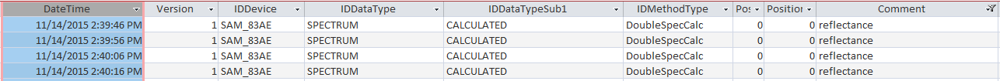

To access the desired radiometry, we need first to create a dictionary with the conditions for each radiometry type, as demonstrated bellow. Once the `select_radiometries` is successfully called, it will retrieve the times that coincide with all the types, if <b>logic='and'</b> or all times found on the MDB if <b>logic='or'</b>. Each radiometry DataFrame will be loaded in the `.measurements` attribute. That will be explained in the Accessing Measurements section.

In [382]:
rtypes = {'reflectance': {'IDDevice': 'SAM_83AE', 'Comment': 'reflectance'},
          'Ed': {'IDDevice': 'SAM_83ba', 'IDDataTypeSub1': 'CALIBRATED'},
          'Lu': {'IDDevice': 'SAM_83AE', 'IDDataTypeSub1': 'CALIBRATED'},
          'Ld': {'IDDevice': 'SAM_83B0', 'IDDataTypeSub1': 'CALIBRATED'},
         }
mdb.select_radiometries(rtypes, logic='and')
mdb.times

DatetimeIndex(['2015-11-14 14:39:45', '2015-11-14 14:39:55',
               '2015-11-14 14:40:05', '2015-11-14 14:40:15',
               '2015-11-14 14:40:25', '2015-11-14 14:40:35',
               '2015-11-14 14:40:45', '2015-11-14 14:40:55',
               '2015-11-14 14:41:05', '2015-11-14 14:41:15',
               '2015-11-14 14:41:25', '2015-11-14 14:41:35',
               '2015-11-14 14:41:45', '2015-11-14 14:41:55',
               '2015-11-14 14:42:05', '2015-11-14 14:42:15',
               '2015-11-14 14:42:25', '2015-11-14 14:42:35',
               '2015-11-14 14:42:45', '2015-11-14 14:42:55',
               '2015-11-14 14:43:05', '2015-11-14 14:43:15',
               '2015-11-14 14:43:25', '2015-11-14 14:43:35',
               '2015-11-14 14:43:45', '2015-11-14 14:43:55',
               '2015-11-14 14:44:05', '2015-11-14 14:44:15',
               '2015-11-14 14:44:25', '2015-11-14 14:44:35',
               '2015-11-14 14:44:45', '2015-11-14 14:44:55',
               '2015-11-

## Selecting Measurements Datetimes

One important function for the MDB manipulation, is the possibility to quickly filter the datetime to export just the correct measurement. That's because normally one Trios/MSDA MDB can store multiple measurements at once. When these measurements are marked with a specific comment (ex. point1, point2, etc.) this can be achieved by passing the rtypes dictionary to the `select_radiometries` function. Otherwise, it is necessary to filter the desired measurement by interval. These measurements can be filtered by time interval. We can either pass start and end datetimes or start and inverval as a timedelta.<br>
Once a time filter is applied, the results will be sliced to the last time frame.<br>
For example:

In [383]:
mdb.filter_times(start='2015-11-14 14:40:15', end='2015-11-14 14:41:15')

DatetimeIndex(['2015-11-14 14:40:15', '2015-11-14 14:40:25',
               '2015-11-14 14:40:35', '2015-11-14 14:40:45',
               '2015-11-14 14:40:55', '2015-11-14 14:41:05',
               '2015-11-14 14:41:15'],
              dtype='datetime64[ns]', freq='10S')

In [384]:
mdb.filter_times(start='2015-11-14 14:44:15', interval=timedelta(minutes=1))

DatetimeIndex(['2015-11-14 14:43:15', '2015-11-14 14:43:25',
               '2015-11-14 14:43:35', '2015-11-14 14:43:45',
               '2015-11-14 14:43:55', '2015-11-14 14:44:05',
               '2015-11-14 14:44:15', '2015-11-14 14:44:25',
               '2015-11-14 14:44:35', '2015-11-14 14:44:45',
               '2015-11-14 14:44:55', '2015-11-14 14:45:05',
               '2015-11-14 14:45:15'],
              dtype='datetime64[ns]', freq='10S')

In [385]:
mdb.time_window

DatetimeIndex(['2015-11-14 14:43:15', '2015-11-14 14:43:25',
               '2015-11-14 14:43:35', '2015-11-14 14:43:45',
               '2015-11-14 14:43:55', '2015-11-14 14:44:05',
               '2015-11-14 14:44:15', '2015-11-14 14:44:25',
               '2015-11-14 14:44:35', '2015-11-14 14:44:45',
               '2015-11-14 14:44:55', '2015-11-14 14:45:05',
               '2015-11-14 14:45:15'],
              dtype='datetime64[ns]', freq='10S')

## Accessing the Measurements

Once the radiometries are selected and the times are correct, it is possible to access the radiometry data using the `get_radiometry` function and specifying the name of the radiometry (as informed in the rdmtry_descr dictionary) or subscripting with ['radiometry name'].

In [386]:
mdb.get_radiometry('reflectance')

1,PositionLatitude,PositionLongitude,IntegrationTime,309.36307445507003,312.69773530624,316.03302990125,319.36894767656,322.70547806863,326.04261051392,329.38033444889,...,1116.54617766943,1119.72230531072,1122.89648919209,1126.06871875,1129.23898342091,1132.40727264128,1135.5735758475698,1138.73788247624,Comment,IDData
2015-11-14 14:43:15,0.0,0.0,128,NaN,NaN,NaN,NaN,0.001254,0.001411,0.001522,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-43-19_536_059
2015-11-14 14:43:25,0.0,0.0,128,NaN,NaN,NaN,NaN,0.001330,0.001499,0.001588,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-43-29_394_073
2015-11-14 14:43:35,0.0,0.0,128,NaN,NaN,NaN,NaN,0.001795,0.001951,0.002057,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-43-39_519_087
2015-11-14 14:43:45,0.0,0.0,128,NaN,NaN,NaN,NaN,0.005049,0.005269,0.005383,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-43-49_690_101
2015-11-14 14:43:55,0.0,0.0,128,NaN,NaN,NaN,NaN,0.000012,0.000159,0.000241,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-44-00_720_115
2015-11-14 14:44:05,0.0,0.0,128,NaN,NaN,NaN,NaN,-0.000441,-0.000308,-0.000224,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-44-09_815_129
2015-11-14 14:44:15,0.0,0.0,128,NaN,NaN,NaN,NaN,0.002399,0.002621,0.002718,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-44-20_345_143
2015-11-14 14:44:25,0.0,0.0,128,NaN,NaN,NaN,NaN,-0.000254,-0.000107,-0.000020,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-44-29_408_157
2015-11-14 14:44:35,0.0,0.0,128,NaN,NaN,NaN,NaN,0.001386,0.001554,0.001633,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-44-40_733_171
2015-11-14 14:44:45,0.0,0.0,128,NaN,NaN,NaN,NaN,0.000653,0.000804,0.000905,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,reflectance,2572_2015-11-14_14-44-49_500_185


In [387]:
# or, alternatively...
mdb['Ed']

1,PositionLatitude,PositionLongitude,IntegrationTime,306.02905791128,309.36307445507003,312.69773530624,316.03302990125,319.36894767656,322.70547806863,326.04261051392,...,1122.89648919209,1126.06871875,1129.23898342091,1132.40727264128,1135.5735758475698,1138.73788247624,1141.90018196375,1145.06046374656,Comment,IDData
2015-11-14 14:43:15,0.0,0.0,8,NaN,NaN,NaN,NaN,226.507746,289.618697,353.828306,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-43-15_755_053
2015-11-14 14:43:25,0.0,0.0,8,NaN,NaN,NaN,NaN,228.100929,290.536203,352.286382,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-43-25_755_067
2015-11-14 14:43:35,0.0,0.0,8,NaN,NaN,NaN,NaN,225.346613,287.045206,353.048274,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-43-35_755_081
2015-11-14 14:43:45,0.0,0.0,8,NaN,NaN,NaN,NaN,226.291721,290.245286,352.703609,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-43-45_755_095
2015-11-14 14:43:55,0.0,0.0,8,NaN,NaN,NaN,NaN,224.293492,288.992108,351.034703,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-43-55_755_109
2015-11-14 14:44:05,0.0,0.0,8,NaN,NaN,NaN,NaN,223.672420,290.491446,351.270527,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-44-05_755_123
2015-11-14 14:44:15,0.0,0.0,8,NaN,NaN,NaN,NaN,224.077467,290.424312,351.216106,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-44-15_755_137
2015-11-14 14:44:25,0.0,0.0,8,NaN,NaN,NaN,NaN,225.940681,289.148756,353.447360,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-44-25_755_151
2015-11-14 14:44:35,0.0,0.0,8,NaN,NaN,NaN,NaN,225.373616,291.095657,355.025565,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-44-35_755_165
2015-11-14 14:44:45,0.0,0.0,8,NaN,NaN,NaN,NaN,228.451969,290.021505,354.807881,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ed deck,2572_2015-11-14_14-44-45_755_179


<b>OBS: </b> Keep in mind that this result is filtered by the `self.time_window`, and if it is not the desired behavior, self.time_window should be reset to None.

## Visualizing the Radiometries 

The objective of the RadiometryMDB class is basically search and export the measurements from the Trios/MSDA mdb. To more advanced manipulation, such as interpolation, reflectance calculation or data cleaning, the Radiometry class is more appropriated. Even so, the RadiometryMDB is filled with some basic plotting functions, to make sure what is being exported makes sense.

In [388]:
# to reset the time filter, it is enough to set time_window=None
mdb.time_window = None
mdb.plot_radiometry('reflectance', min_wl=380, max_wl=950)

In [389]:
mdb.plot_radiometries(cols=2,  min_wl=380, max_wl=950)

## Exporting the Radiometry

The last step is to export the radiometries to a text file. The output is a .txt file in the Trios/MSDA format (similar to the .mlb files)<br>
The `create_measurement_dir` flag indicates if the a subdirectory must be created. The subdirectory name follows the format YYYYMMDD-mmss and is the format used by the `RadiometryDatabase` class.<br> 
Keep in mind that this format is not easy to be manipulated. It is intended to maintain compatibility with MSDA output files.<br>
For a more user-friendly format, it is suggested to use the interpolated output provided by the `Radiometry` class. 

In [390]:
out_dir = mdb.export_txt(create_measurement_dir=True)

Saving output file to ..\mdbs\20151114-1439


The output directory is returned. It is a good practice to store it in a variable, because it will be used to open the `Radiometry` class. Let's now check the files that have been saved:

In [391]:
[file for file in out_dir.iterdir()]

[WindowsPath('../mdbs/20151114-1439/Ed_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/Ld_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/Lu_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/reflectance_spectrum_LO.txt')]

Let's check the contents of the reflectance file. We can open it in the Notepad or any other text editor.
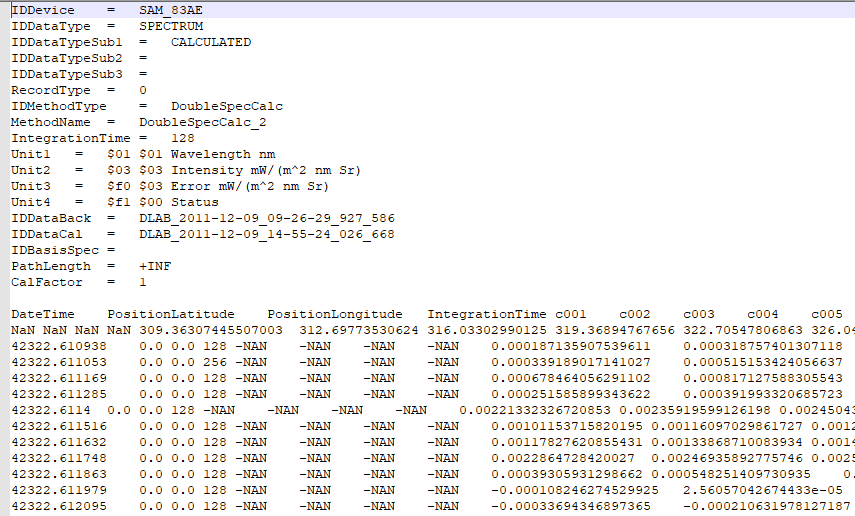

As already mentioned, we can see that this format is not user friendly to be opened in Excel or in a Pandas DataFrame, for example. The interpolated .csv output provided by the Radiometry class is more appropriate for these purposes.

# Radiometry class

The Radiometry class is able to open multiple radiometries referred to the same measurement. It looks automatically for the following suffixes `['.txt', '.csv', '.mlb']`

In [392]:
from HyperspectralTrios import Radiometry
Radiometry.default_prefixes

['Rrs', 'Ed', 'Ld', 'Lu']

In [393]:
rd = Radiometry.from_folder(folder=out_dir,
                            prefixes=['reflectance', 'Ed', 'Ld', 'Lu'],
                            base_name='spectrum_LO')

In [394]:
rd.times_range()

('2015-11-14 14:39:45', '2015-11-14 14:45:55')

## Accessing the radiometries

In [395]:
df = rd['Ed']
df.head(3)

,306.02905791128,309.36307445507003,312.69773530624,316.03302990125,319.36894767656,322.70547806863,326.04261051392,329.38033444889,332.71863931,336.05751453371005,...,1122.89648919209,1126.06871875,1129.23898342091,1132.40727264128,1135.5735758475698,1138.73788247624,1141.90018196375,1145.06046374656,NaN.4,NaN.5
DateTime,,,,,,,,,,,,,,,,,,,,,
2015-11-14 14:39:45,-NAN,-NAN,-NAN,-NAN,234.149624,300.382603,363.859881,417.886308,442.369263,465.859901,...,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,Ed deck,2572_2015-11-14_14-39-45_755_759
2015-11-14 14:39:55,-NAN,-NAN,-NAN,-NAN,204.368246,263.216337,319.263288,361.577456,381.365462,401.640190,...,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,Ed deck,2572_2015-11-14_14-39-55_755_773
2015-11-14 14:40:05,-NAN,-NAN,-NAN,-NAN,234.689686,297.204901,363.569637,413.336609,436.606364,460.319149,...,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,Ed deck,2572_2015-11-14_14-40-05_755_787


## Plotting spectra

In [396]:
rd.labels.update({'reflectance': {'y_axis': 'Reflectance (sr^-1)', 'title': 'Reflectance spectra'}})

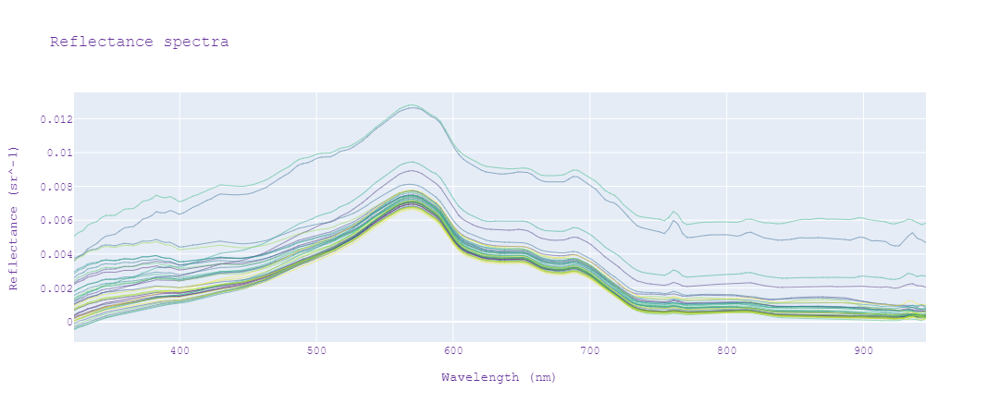

In [397]:
rd.plot_radiometry('reflectance', interpolated=False)

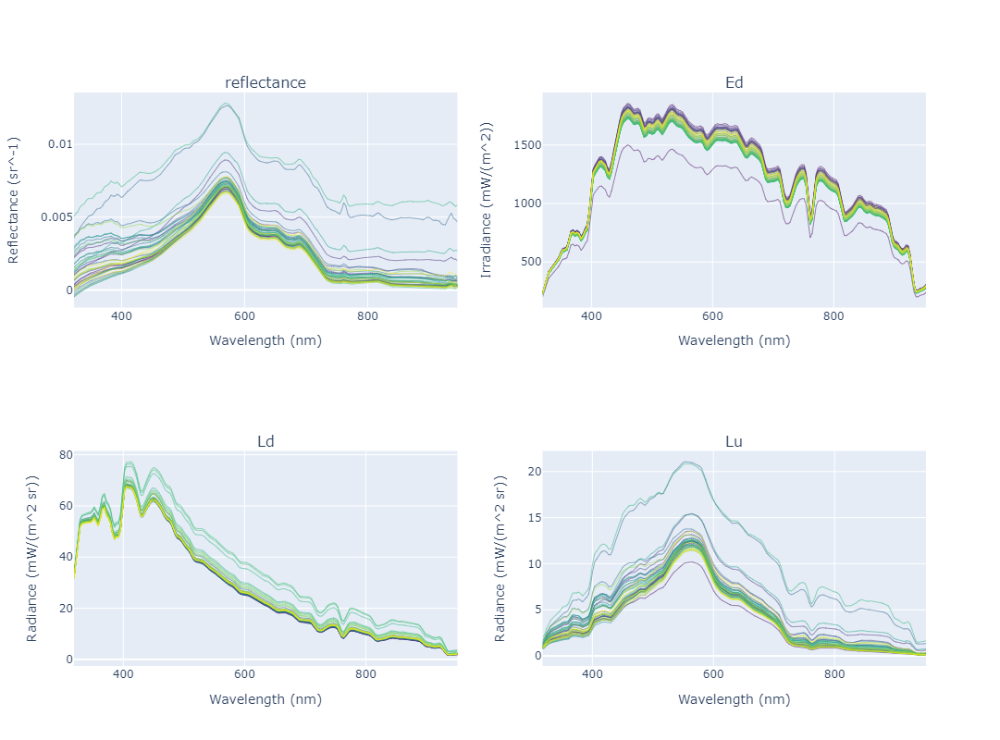

In [398]:
rd.plot_radiometries(interpolated=False, )

The radiometry can also plot the mean spectrum with upper and lower bands shifted by <b>X</b> standard deviations.

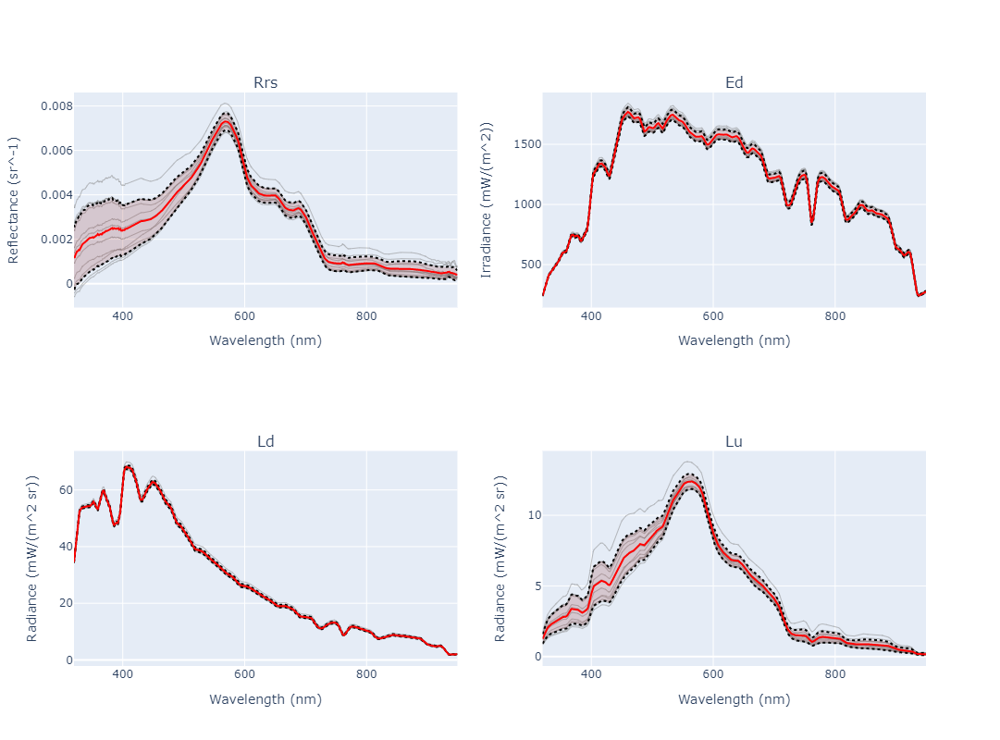

In [417]:
rd.plot_radiometries(mean=True, std_delta=1.)

## When there is no reflectance

It is common not to have the reflectance generated in the MDB file, and we have to do it internally. In this case, we will open only the radiance Ed and radiances Lu and Ld. 

In [399]:
rd = Radiometry.from_folder(folder=out_dir,
                            prefixes=['Ed', 'Ld', 'Lu'],
                            base_name='spectrum_LO')

After loading the irradiance (Ed) and radiances (Ld and Lu), we are able to calculate the reflectance. The following formula will be used:<br>
$\displaystyle Rrs = \frac{Lu-\rho Ld}{Ed}$, where $\rho$ is a constant that can be adjusted during the method call. <br>
The names for the loaded radiometries have to be passed. If Ld is not passed, it is calculated only with Lu and Ed. <br><br>
<b>OBS:</b> Note, however, that the reflectance is always calculated with interpolated wave lengths. That's because it can happen that the sensors have different hyperspectral bands. The `calc_reflectance` interpolates automatically everything and saves them as new files. 

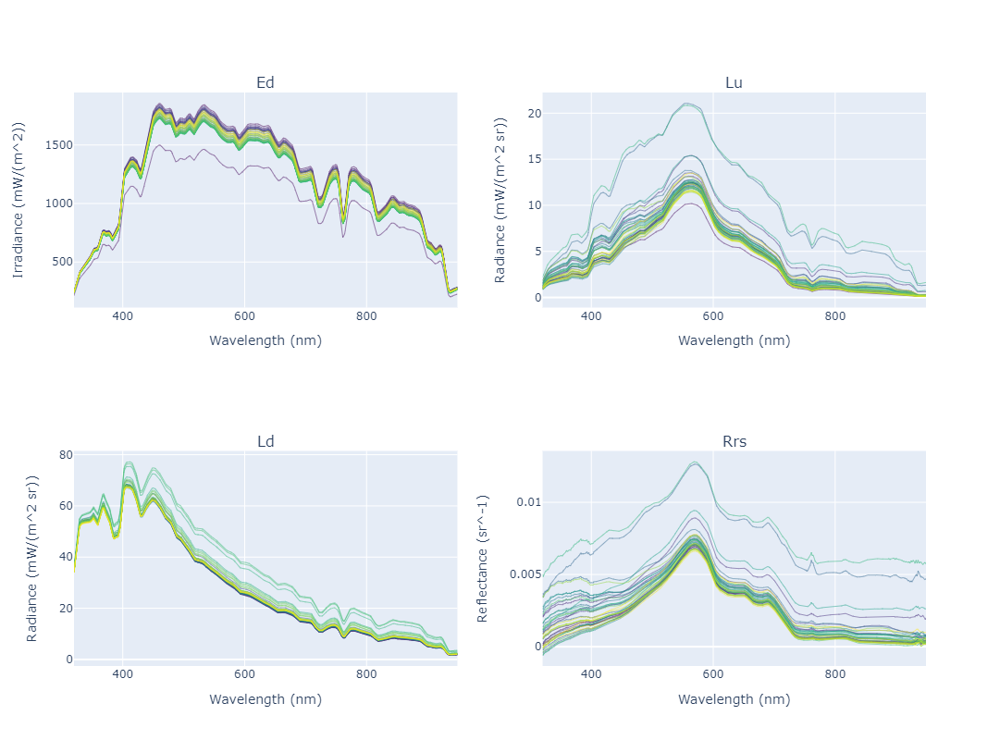

In [400]:
rd.create_reflectance(ed='Ed', ld='Ld', lu='Lu')

rd.plot_radiometries(interpolated=True)

## Filtering/cleaning Data

One of the most important features of the `Radiometry` class, is the possibility to quickly filter the curves by time or values, accumulating the filters and displaying the results. Two class members are important to understand. `Radiometry.times` and `Radiometry.subset`.<br>
* `Radiometry.times`: The `.times` member returns all the times that are currently loaded. By default, it returns the datetimes present in the intrepolated radiometries, otherwise it searches for the datetimes in the raw radiometries.
* `Radiometry.subset`: The `.subset` member represents the currently selected times that can be used to plot or to export if `use_subset` flag is on. If no subset is defined, all the series is provided.

In [401]:
rd.times

DatetimeIndex(['2015-11-14 14:39:45', '2015-11-14 14:39:55',
               '2015-11-14 14:40:05', '2015-11-14 14:40:15',
               '2015-11-14 14:40:25', '2015-11-14 14:40:35',
               '2015-11-14 14:40:45', '2015-11-14 14:40:55',
               '2015-11-14 14:41:05', '2015-11-14 14:41:15',
               '2015-11-14 14:41:25', '2015-11-14 14:41:35',
               '2015-11-14 14:41:45', '2015-11-14 14:41:55',
               '2015-11-14 14:42:05', '2015-11-14 14:42:15',
               '2015-11-14 14:42:25', '2015-11-14 14:42:35',
               '2015-11-14 14:42:45', '2015-11-14 14:42:55',
               '2015-11-14 14:43:05', '2015-11-14 14:43:15',
               '2015-11-14 14:43:25', '2015-11-14 14:43:35',
               '2015-11-14 14:43:45', '2015-11-14 14:43:55',
               '2015-11-14 14:44:05', '2015-11-14 14:44:15',
               '2015-11-14 14:44:25', '2015-11-14 14:44:35',
               '2015-11-14 14:44:45', '2015-11-14 14:44:55',
               '2015-11-

In [402]:
rd.apply_time_filter(start='2015-11-14 14:42:05', interval=timedelta(minutes=1))

DatetimeIndex(['2015-11-14 14:41:05', '2015-11-14 14:41:15',
               '2015-11-14 14:41:25', '2015-11-14 14:41:35',
               '2015-11-14 14:41:45', '2015-11-14 14:41:55',
               '2015-11-14 14:42:05', '2015-11-14 14:42:15',
               '2015-11-14 14:42:25', '2015-11-14 14:42:35',
               '2015-11-14 14:42:45', '2015-11-14 14:42:55',
               '2015-11-14 14:43:05'],
              dtype='datetime64[ns]', name='DateTime', freq=None)

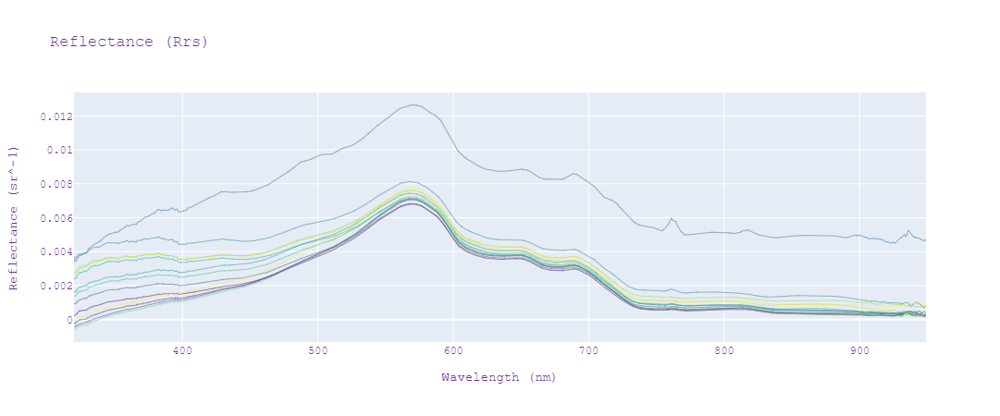

In [403]:
rd.plot_radiometry('Rrs', use_subset=True)

If we want to filter even further, we can accumulate the previous filter (subset) with other filters by value, for example. Note that the subset is applied to all radiometries, and appears in all plots.

In [404]:
rd.apply_value_filter('Rrs', max_value=0.01, accumulate=True)

DatetimeIndex(['2015-11-14 14:41:05', '2015-11-14 14:41:15',
               '2015-11-14 14:41:25', '2015-11-14 14:41:35',
               '2015-11-14 14:41:55', '2015-11-14 14:42:05',
               '2015-11-14 14:42:15', '2015-11-14 14:42:25',
               '2015-11-14 14:42:35', '2015-11-14 14:42:45',
               '2015-11-14 14:42:55', '2015-11-14 14:43:05'],
              dtype='datetime64[ns]', name='DateTime', freq=None)

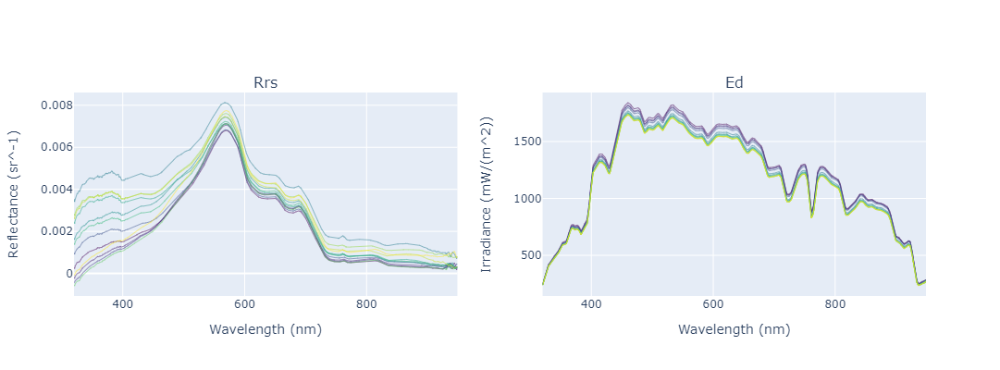

In [504]:
rd.plot_radiometries(['Rrs', 'Ed'], use_subset=True)

## Saving the results

Now we have filtered our radiometries, we can export the results to the text files. As we have already mentioned, the `.txt` files use the same format as the MSDA/TRIOS and are not "user friendly" to be opened in Excel, for example. Hopefuly, we can now export also the interpolated version that is easily opened as a csv file.<br>
Additionally, when we use save method, it can export only the filtered spectra and save the old version in a `.bak` file. <br>
<br>
The files can be saved one at a time or all at once. Let's check what we have in the object and export the reflectance (Rrs) we created earlier.<br>
To verify the object contents, it is enough to type its name in a cell:

In [406]:
rd

Class Radiometry
Raw radiometries: ['Ed', 'Ld', 'Lu'] 
Interpolated radiometries: ['Ed', 'Lu', 'Ld', 'Rrs'] 
Folder: ..\mdbs\20151114-1439 
Date Range: ('2015-11-14 14:39:45', '2015-11-14 14:45:55') 

In [407]:
rd.save_radiometry('Rrs', subset=True, save_interpolated=True, save_backup=True)

File ..\mdbs\20151114-1439\Rrs_interpolated.csv does not exists to be backed up


The message is just to inform that there was no previous file to be backed up.<br>
We can now open this file in excel to see how it looks like.<br>
<b>OBS:</b> Note that the default separator for the CSV is ';' and not ',', but if can be passed as parameter to the save method.<br>
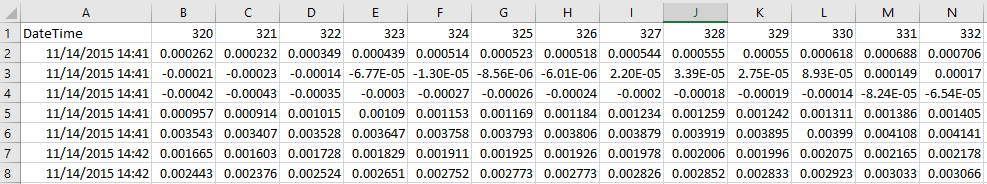

We can notice that we have a very "clean" format and a understandable DateTime column, much different from the format seen in the `.txt` files.<br>
<br>
Now, to save all radiometries at once, we can use the `save_radiometries` method:

In [408]:
rd.save_radiometries(subset=True, save_interpolated=True, save_backup=True)

File ..\mdbs\20151114-1439\Ld_interpolated.csv does not exists to be backed up
File ..\mdbs\20151114-1439\Lu_interpolated.csv does not exists to be backed up
File ..\mdbs\20151114-1439\Ed_interpolated.csv does not exists to be backed up


In [409]:
# let's check our directory:
[file for file in rd.folder.iterdir()]

[WindowsPath('../mdbs/20151114-1439/Ed_interpolated.csv'),
 WindowsPath('../mdbs/20151114-1439/Ed_spectrum_LO.bak'),
 WindowsPath('../mdbs/20151114-1439/Ed_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/Ld_interpolated.csv'),
 WindowsPath('../mdbs/20151114-1439/Ld_spectrum_LO.bak'),
 WindowsPath('../mdbs/20151114-1439/Ld_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/Lu_interpolated.csv'),
 WindowsPath('../mdbs/20151114-1439/Lu_spectrum_LO.bak'),
 WindowsPath('../mdbs/20151114-1439/Lu_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/reflectance_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/Rrs_interpolated.bak'),
 WindowsPath('../mdbs/20151114-1439/Rrs_interpolated.csv')]

In [410]:
rd = Radiometry.from_folder(rd.folder, load_interpolated=True, read_backup=False)

Rrs:Raw not found in ..\mdbs\20151114-1439


To save the graphs, we can use the save_radiometries_graph() method. If no folder is provided, the figure is saved in the same folder of the radiometries. Don't forget to pass use_subset 

In [420]:
rd.save_radiometries_graph(folder=None, use_subset=True)

Saving image Fig_20151114-1439.png into: ..\mdbs\20151114-1439


In [426]:
import matplotlib


In [427]:
matplotlib.__version__

'3.3.3'

In [428]:
matplotlib.cm

<module 'matplotlib.cm' from 'd:\\programs\\anaconda\\envs\\waterclass_env\\lib\\site-packages\\matplotlib\\cm.py'>

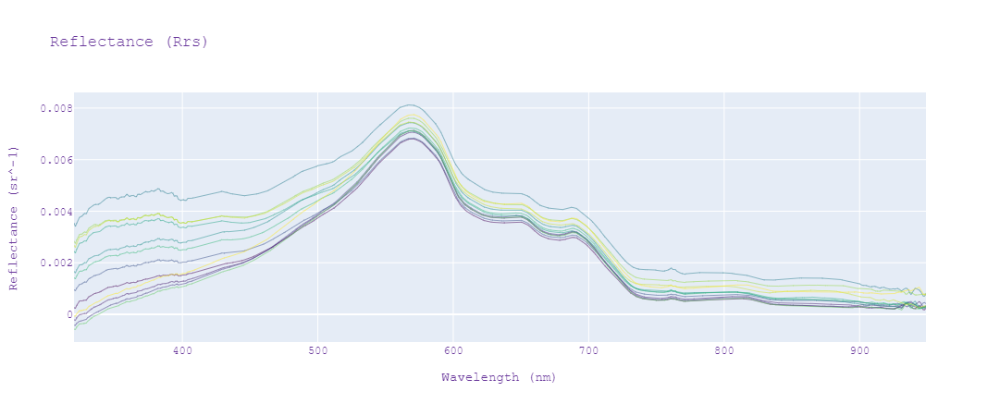

In [503]:
rd.plot_radiometry()

In [446]:
def get_color(colorscale_name, loc):
    from _plotly_utils.basevalidators import ColorscaleValidator
    # first parameter: Name of the property being validated
    # second parameter: a string, doesn't really matter in our use case
    cv = ColorscaleValidator("colorscale", "")
    # colorscale will be a list of lists: [[loc1, "rgb1"], [loc2, "rgb2"], ...] 
    colorscale = cv.validate_coerce(colorscale_name)
    
    if hasattr(loc, "__iter__"):
        return [get_continuous_color(colorscale, x) for x in loc]
    return get_continuous_color(colorscale, loc)
        

# Identical to Adam's answer
import plotly.colors
from PIL import ImageColor

def get_continuous_color(colorscale, intermed):
    """
    Plotly continuous colorscales assign colors to the range [0, 1]. This function computes the intermediate
    color for any value in that range.

    Plotly doesn't make the colorscales directly accessible in a common format.
    Some are ready to use:
    
        colorscale = plotly.colors.PLOTLY_SCALES["Greens"]

    Others are just swatches that need to be constructed into a colorscale:

        viridis_colors, scale = plotly.colors.convert_colors_to_same_type(plotly.colors.sequential.Viridis)
        colorscale = plotly.colors.make_colorscale(viridis_colors, scale=scale)

    :param colorscale: A plotly continuous colorscale defined with RGB string colors.
    :param intermed: value in the range [0, 1]
    :return: color in rgb string format
    :rtype: str
    """
    if len(colorscale) < 1:
        raise ValueError("colorscale must have at least one color")

    hex_to_rgb = lambda c: "rgb" + str(ImageColor.getcolor(c, "RGB"))

    if intermed <= 0 or len(colorscale) == 1:
        c = colorscale[0][1]
        return c if c[0] != "#" else hex_to_rgb(c)
    if intermed >= 1:
        c = colorscale[-1][1]
        return c if c[0] != "#" else hex_to_rgb(c)

    for cutoff, color in colorscale:
        if intermed > cutoff:
            low_cutoff, low_color = cutoff, color
        else:
            high_cutoff, high_color = cutoff, color
            break

    if (low_color[0] == "#") or (high_color[0] == "#"):
        # some color scale names (such as cividis) returns:
        # [[loc1, "hex1"], [loc2, "hex2"], ...]
        low_color = hex_to_rgb(low_color)
        high_color = hex_to_rgb(high_color)

    return plotly.colors.find_intermediate_color(
        lowcolor=low_color,
        highcolor=high_color,
        intermed=((intermed - low_cutoff) / (high_cutoff - low_cutoff)),
        colortype="rgb",
    )

In [450]:
get_color("Viridis", 0.1)

'rgb(71.6, 36.10000000000001, 116.4)'

In [432]:
px.colors.sequential.Viridis

['#440154',
 '#482878',
 '#3e4989',
 '#31688e',
 '#26828e',
 '#1f9e89',
 '#35b779',
 '#6ece58',
 '#b5de2b',
 '#fde725']

In [434]:
import plotly.graph_objects as go


In [435]:
import plotly


In [444]:
plotly.colors.sequential.Bluered

['rgb(0,0,255)', 'rgb(255,0,0)']

In [445]:
px.colors.validate_colorscale?

Signature: px.colors.validate_colorscale(colorscale)
Docstring: Validate the structure, scale values and colors of colorscale.
File:      d:\programs\anaconda\envs\waterclass_env\lib\site-packages\_plotly_utils\colors\__init__.py
Type:      function


In [470]:
rd.plot_radiometry(use_subset=True)

DatetimeIndex(['2015-11-14 14:41:05', '2015-11-14 14:41:15',
               '2015-11-14 14:41:25', '2015-11-14 14:41:35',
               '2015-11-14 14:41:55', '2015-11-14 14:42:05',
               '2015-11-14 14:42:15', '2015-11-14 14:42:25',
               '2015-11-14 14:42:35', '2015-11-14 14:42:45',
               '2015-11-14 14:42:55', '2015-11-14 14:43:05'],
              dtype='datetime64[ns]', name='DateTime', freq=None)

In [456]:
get_color("Viridis", 0.5)

'rgb(34.5, 144.0, 139.5)'

In [498]:
s = pd.Series(df.index.astype('int'), index=df.index)

In [502]:
(s - s.min())/(s-s.min()).max()

DateTime
2015-11-14 14:39:45    0.000000
2015-11-14 14:39:55    0.027027
2015-11-14 14:40:05    0.054054
2015-11-14 14:40:15    0.081081
2015-11-14 14:40:25    0.108108
2015-11-14 14:40:35    0.135135
2015-11-14 14:40:45    0.162162
2015-11-14 14:40:55    0.189189
2015-11-14 14:41:05    0.216216
2015-11-14 14:41:15    0.243243
2015-11-14 14:41:25    0.270270
2015-11-14 14:41:35    0.297297
2015-11-14 14:41:45    0.324324
2015-11-14 14:41:55    0.351351
2015-11-14 14:42:05    0.378378
2015-11-14 14:42:15    0.405405
2015-11-14 14:42:25    0.432432
2015-11-14 14:42:35    0.459459
2015-11-14 14:42:45    0.486486
2015-11-14 14:42:55    0.513514
2015-11-14 14:43:05    0.540541
2015-11-14 14:43:15    0.567568
2015-11-14 14:43:25    0.594595
2015-11-14 14:43:35    0.621622
2015-11-14 14:43:45    0.648649
2015-11-14 14:43:55    0.675676
2015-11-14 14:44:05    0.702703
2015-11-14 14:44:15    0.729730
2015-11-14 14:44:25    0.756757
2015-11-14 14:44:35    0.783784
2015-11-14 14:44:45    0.810811

In [494]:
(s/1e11).astype('float32')

DateTime
2015-11-14 14:39:45    14475120.0
2015-11-14 14:39:55    14475120.0
2015-11-14 14:40:05    14475120.0
2015-11-14 14:40:15    14475120.0
2015-11-14 14:40:25    14475120.0
2015-11-14 14:40:35    14475120.0
2015-11-14 14:40:45    14475120.0
2015-11-14 14:40:55    14475121.0
2015-11-14 14:41:05    14475121.0
2015-11-14 14:41:15    14475121.0
2015-11-14 14:41:25    14475121.0
2015-11-14 14:41:35    14475121.0
2015-11-14 14:41:45    14475121.0
2015-11-14 14:41:55    14475121.0
2015-11-14 14:42:05    14475121.0
2015-11-14 14:42:15    14475121.0
2015-11-14 14:42:25    14475121.0
2015-11-14 14:42:35    14475122.0
2015-11-14 14:42:45    14475122.0
2015-11-14 14:42:55    14475122.0
2015-11-14 14:43:05    14475122.0
2015-11-14 14:43:15    14475122.0
2015-11-14 14:43:25    14475122.0
2015-11-14 14:43:35    14475122.0
2015-11-14 14:43:45    14475122.0
2015-11-14 14:43:55    14475122.0
2015-11-14 14:44:05    14475122.0
2015-11-14 14:44:15    14475123.0
2015-11-14 14:44:25    14475123.0
2015-

In [486]:
s/s.max()

DateTime
2015-11-14 14:39:45    1.0
2015-11-14 14:39:55    1.0
2015-11-14 14:40:05    1.0
2015-11-14 14:40:15    1.0
2015-11-14 14:40:25    1.0
2015-11-14 14:40:35    1.0
2015-11-14 14:40:45    1.0
2015-11-14 14:40:55    1.0
2015-11-14 14:41:05    1.0
2015-11-14 14:41:15    1.0
2015-11-14 14:41:25    1.0
2015-11-14 14:41:35    1.0
2015-11-14 14:41:45    1.0
2015-11-14 14:41:55    1.0
2015-11-14 14:42:05    1.0
2015-11-14 14:42:15    1.0
2015-11-14 14:42:25    1.0
2015-11-14 14:42:35    1.0
2015-11-14 14:42:45    1.0
2015-11-14 14:42:55    1.0
2015-11-14 14:43:05    1.0
2015-11-14 14:43:15    1.0
2015-11-14 14:43:25    1.0
2015-11-14 14:43:35    1.0
2015-11-14 14:43:45    1.0
2015-11-14 14:43:55    1.0
2015-11-14 14:44:05    1.0
2015-11-14 14:44:15    1.0
2015-11-14 14:44:25    1.0
2015-11-14 14:44:35    1.0
2015-11-14 14:44:45    1.0
2015-11-14 14:44:55    1.0
2015-11-14 14:45:05    1.0
2015-11-14 14:45:15    1.0
2015-11-14 14:45:25    1.0
2015-11-14 14:45:35    1.0
2015-11-14 14:45:45

In [479]:
s

DateTime
2015-11-14 14:39:45    1.0
2015-11-14 14:39:55    1.0
2015-11-14 14:40:05    1.0
2015-11-14 14:40:15    1.0
2015-11-14 14:40:25    1.0
2015-11-14 14:40:35    1.0
2015-11-14 14:40:45    1.0
2015-11-14 14:40:55    1.0
2015-11-14 14:41:05    1.0
2015-11-14 14:41:15    1.0
2015-11-14 14:41:25    1.0
2015-11-14 14:41:35    1.0
2015-11-14 14:41:45    1.0
2015-11-14 14:41:55    1.0
2015-11-14 14:42:05    1.0
2015-11-14 14:42:15    1.0
2015-11-14 14:42:25    1.0
2015-11-14 14:42:35    1.0
2015-11-14 14:42:45    1.0
2015-11-14 14:42:55    1.0
2015-11-14 14:43:05    1.0
2015-11-14 14:43:15    1.0
2015-11-14 14:43:25    1.0
2015-11-14 14:43:35    1.0
2015-11-14 14:43:45    1.0
2015-11-14 14:43:55    1.0
2015-11-14 14:44:05    1.0
2015-11-14 14:44:15    1.0
2015-11-14 14:44:25    1.0
2015-11-14 14:44:35    1.0
2015-11-14 14:44:45    1.0
2015-11-14 14:44:55    1.0
2015-11-14 14:45:05    1.0
2015-11-14 14:45:15    1.0
2015-11-14 14:45:25    1.0
2015-11-14 14:45:35    1.0
2015-11-14 14:45:45